# VIA Tutorial

In [1]:
import pyVIA.core as via
import pyVIA.datasets_via as   datasets
import pandas as pd 
import scanpy as sc
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

/home/shobi/anaconda3/envs/Via2Env/lib/python3.7/site-packages/phate/__init__.py


## Load data from directory
We use annotations given by SingleR which uses Novershtern Hematopoietic cell data as the reference. These are in line with the annotations given by Setty et al., 2019 but offer a slightly more granular annotation.

In [2]:
adata = datasets.scRNA_hematopoiesis()
sc.tl.pca(adata, svd_solver='arpack', n_comps=200)
tsnem = adata.obsm['tsne']
adata

Cell type BASO1 has  2 cells
Cell type MEP has  339 cells
Cell type TCEL7 has  1 cells
Cell type PRE_B2 has  515 cells
Cell type HSC2 has  10 cells
Cell type PRE_B3 has  2 cells
Cell type mDC (cDC) has  96 cells
Cell type CMP has  968 cells
Cell type ERY4 has  53 cells
Cell type GMP has  28 cells
Cell type pDC has  204 cells
Cell type HSC1 has  2365 cells
Cell type MONO2 has  35 cells
Cell type Nka3 has  5 cells
Cell type MEGA1 has  12 cells
Cell type ERY2 has  40 cells
Cell type GRAN1 has  3 cells
Cell type B_a1 has  27 cells
Cell type MONO1 has  186 cells
Cell type ERY3 has  104 cells
Cell type EOS2 has  3 cells
Cell type B_a2 has  1 cells
Cell type ERY1 has  773 cells
Cell type B_a4 has  8 cells


AnnData object with n_obs × n_vars = 5780 × 14651
    obs: 'clusters', 'palantir_pseudotime', 'palantir_diff_potential', 'label'
    uns: 'cluster_colors', 'ct_colors', 'palantir_branch_probs_cell_types', 'pca'
    obsm: 'tsne', 'MAGIC_imputed_data', 'palantir_branch_probs', 'X_pca'
    varm: 'PCs'

## User's choice of embedding
Three embedding exmaples: TSNE, UMAP, and PHATE 
Alternatively allow via.VIA() to compute an embedding using the underlying graph by setting: do_embedding = True AND embedding_type = 'via-umap' OR 'via-mds'

In [3]:
# TSNE - same as the embedding used in the original Setty et al., publication
embedding = adata.obsm['tsne']

# # UMAP
# ncomp = 30
# embedding = umap.UMAP().fit_transform(adata.obsm['X_pca'][:, 0:ncomp])

# # PHATE
# ncomp = 30
# phate_op = phate.PHATE()
# embedding = phate_op.fit_transform(adata.obsm['X_pca'][:, 0:ncomp])

## Run VIA
#### Key Parameters:
- knn
- dataset
- root_user
- jac_std_global
- too_big_factor
- cluster_graph_pruning
- embedding (optional) can be run without an embedding, can prompt via to compute an embedding, or provide an embedding later directly to the plotting functions

2023-01-03 11:49:45.843448	Running VIA over input data of 5780 (samples) x 80 (features)
2023-01-03 11:49:45.843555	Knngraph has 30 neighbors
2023-01-03 11:49:48.662338	Finished global pruning of 30-knn graph used for clustering at level of 0.15. Kept 46.2 % of edges. 
2023-01-03 11:49:48.688017	Number of connected components used for clustergraph  is 1
2023-01-03 11:49:48.956358	Commencing community detection
2023-01-03 11:49:49.229878	Finished running Leiden algorithm. Found 209 clusters.
2023-01-03 11:49:49.232022	Merging 190 very small clusters (<10)
2023-01-03 11:49:49.235605	Finished detecting communities. Found 19 communities
2023-01-03 11:49:49.236138	Making cluster graph. Global cluster graph pruning level: 0.15
2023-01-03 11:49:49.255768	Graph has 1 connected components before pruning
2023-01-03 11:49:49.257464	Graph has 1 connected components before pruning
2023-01-03 11:49:49.258621	Graph has 1 connected components after reconnecting
2023-01-03 11:49:49.258783	0.0% links tr

No handles with labels found to put in legend.


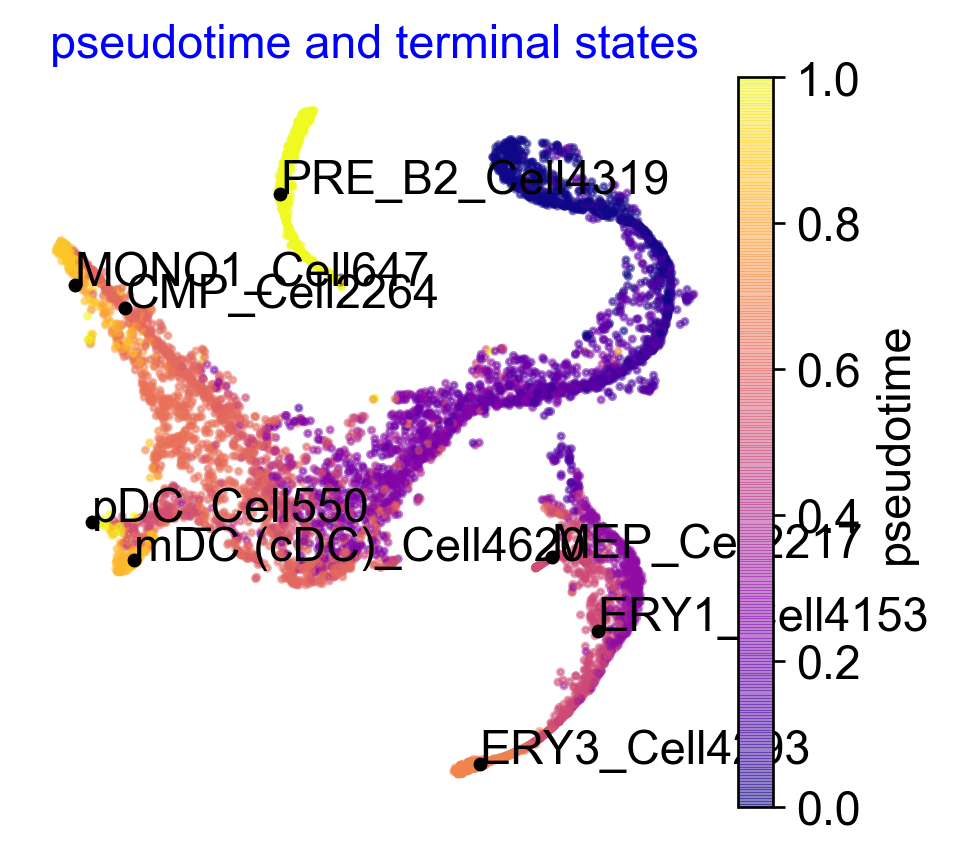

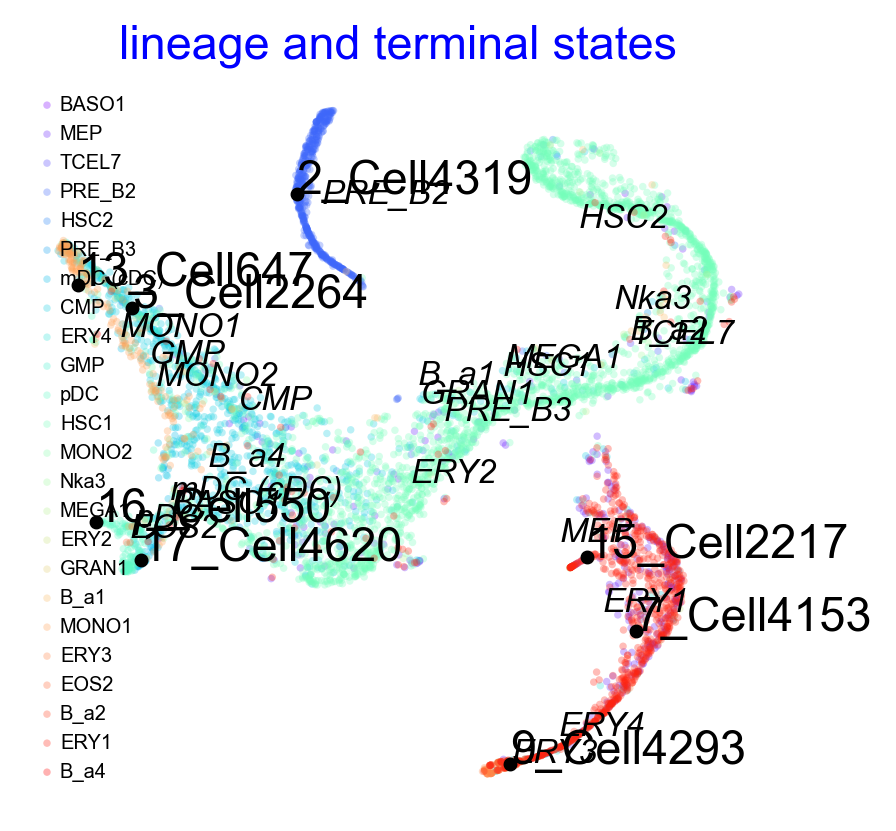

2023-01-03 11:50:07.441588	Time elapsed 20.5 seconds


In [4]:
ncomps=80
knn=30
v0_random_seed=4
root_user = [4823] #the index of a cell belonging to the HSC cell type
dataset = ''

'''
#NOTE1, if you decide to choose a cell type as a root, then you need to set the dataset as 'group'
#root_user=['HSC1']
#dataset = 'group'# 'humanCD34'
#NOTE2, if rna-velocity is available, considering using it to compute the root automatically- see RNA velocity tutorial
'''

v0 = via.VIA(data=adata.obsm['X_pca'][:, 0:ncomps], true_label=adata.obs['label'], 
             jac_std_global=0.15, cluster_graph_pruning_std=0.15,
             knn=knn, too_big_factor=0.3, root_user=root_user, 
             dataset=dataset, random_seed=v0_random_seed, embedding = embedding)

v0.run_VIA()

#NOTE2: if you want to pre-specify terminal states you can do so by a list of group-level names corresponding to true-labels OR by a list of single cell indices
#E.G. user_defined_terminal_group=['pDC','ERY1', 'ERY3', 'MONO1','mDC (cDC)','PRE_B2']

## Cluster Level Trajectory Plots

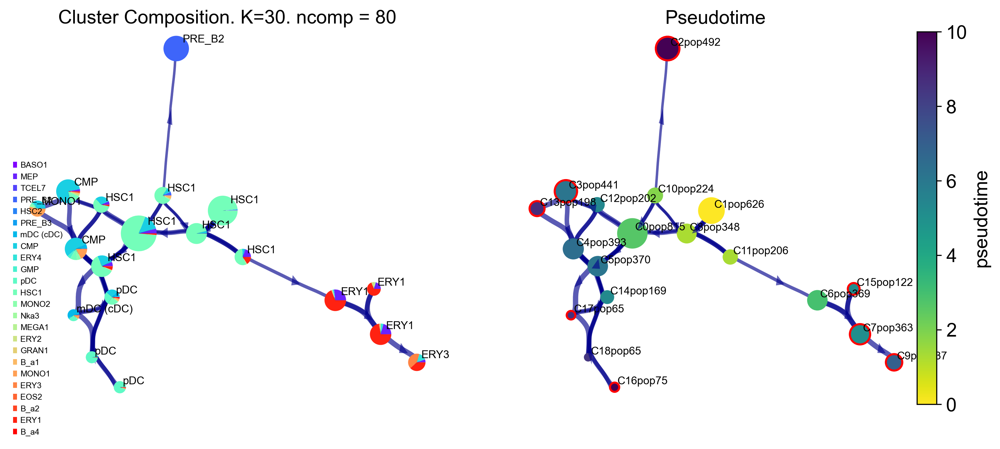

In [5]:
fig, ax, ax1 = via.draw_piechart_graph(via0=v0)
fig.set_size_inches(12,5)

## Visualise gene/feature graph
View the gene expression along the VIA graph. We use the computed HNSW small world graph in VIA to accelerate the gene imputation calculations (using similar approach to MAGIC) as follows:
##### Note: df_magic_cluster contains mean cluster-level gene/feature values

shape of transition matrix raised to power 3 (5780, 5780)


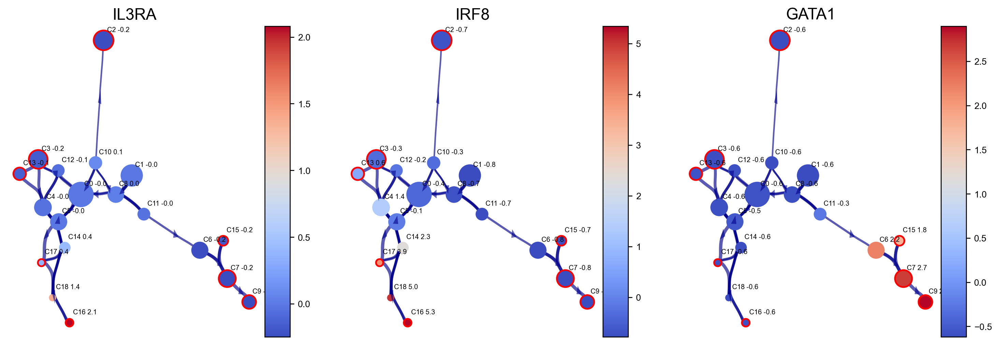

In [6]:
df_ = pd.DataFrame(adata.X)
df_.columns = [i for i in adata.var_names]

gene_list_magic = ['IL3RA', 'IRF8', 'GATA1', 'GATA2', 'ITGA2B', 'MPO', 'CD79B', 'SPI1', 'CD34', 'CSF1R', 'ITGAX']
df_magic = v0.do_impute(df_, magic_steps=3, gene_list=gene_list_magic)
df_magic['parc'] = v0.labels
df_magic_cluster = df_magic.groupby('parc', as_index=True).mean()

fig, axs = via.draw_clustergraph(via_object=v0, type_data='gene', gene_exp=df_magic_cluster, gene_list=gene_list_magic[0:3], arrow_head=0.1)
fig.set_size_inches(15,5)

## Trajectory projection

Visualize the overall VIA trajectory projected onto a 2D embedding (UMAP, Phate, TSNE etc) in different ways. 

1. Draw the high-level clustergraph abstraction onto the embedding;
2. Draws a vector field plot of the more fine-grained directionality of cells along the trajectory projected onto an embedding. 
3. Draw high-edge resolution directed graph

#### Key Parameters:
- scatter_size
- scatter_alpha
- linewidth

100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |########################| Elapsed Time: 0:00:00 Time:  0:00:00
100% (11 of 11) |#######################

2023-01-03 11:52:05.939509	Super cluster 2 is a super terminal with sub_terminal cluster 2
2023-01-03 11:52:05.939593	Super cluster 3 is a super terminal with sub_terminal cluster 3
2023-01-03 11:52:05.939627	Super cluster 7 is a super terminal with sub_terminal cluster 7
2023-01-03 11:52:05.939663	Super cluster 9 is a super terminal with sub_terminal cluster 9
2023-01-03 11:52:05.939690	Super cluster 13 is a super terminal with sub_terminal cluster 13
2023-01-03 11:52:05.939714	Super cluster 15 is a super terminal with sub_terminal cluster 15
2023-01-03 11:52:05.939746	Super cluster 16 is a super terminal with sub_terminal cluster 16
2023-01-03 11:52:05.939778	Super cluster 17 is a super terminal with sub_terminal cluster 17


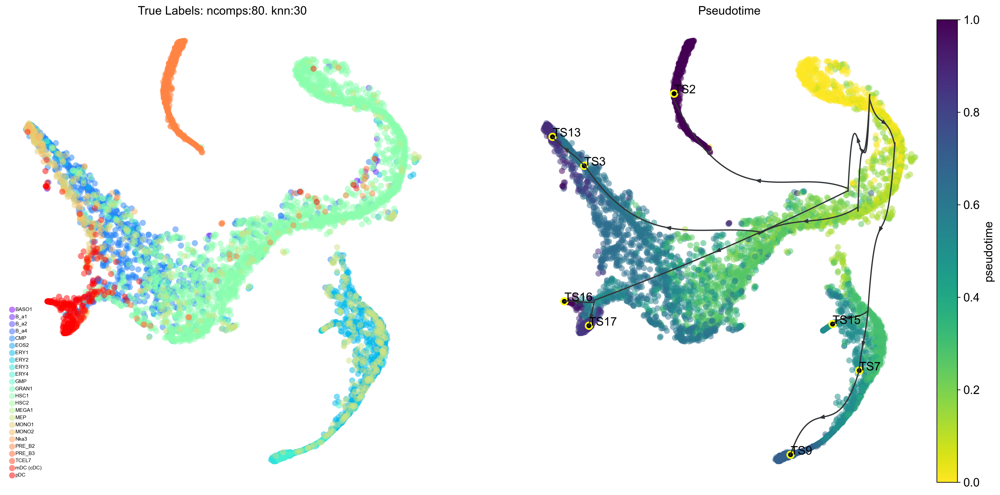

In [12]:
fig, ax, ax1 = via.draw_trajectory_gams(via_coarse=v0,via_fine= v0,embedding=tsnem, draw_all_curves=False)

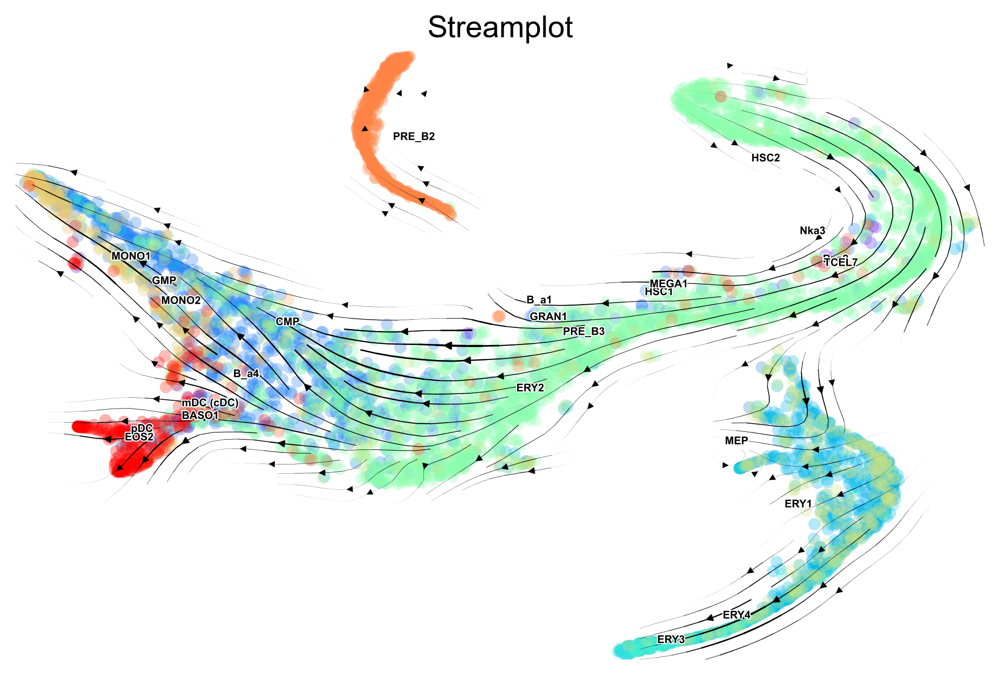

In [9]:
# via_streamplot() requires you to either provide an ndarray as embedding as an input parameter OR for via to have an embedding attribute
fig, ax = via.via_streamplot(v0, embedding, density_grid=0.8, scatter_size=30, scatter_alpha=0.3, linewidth=0.5)
fig.set_size_inches(8,5)

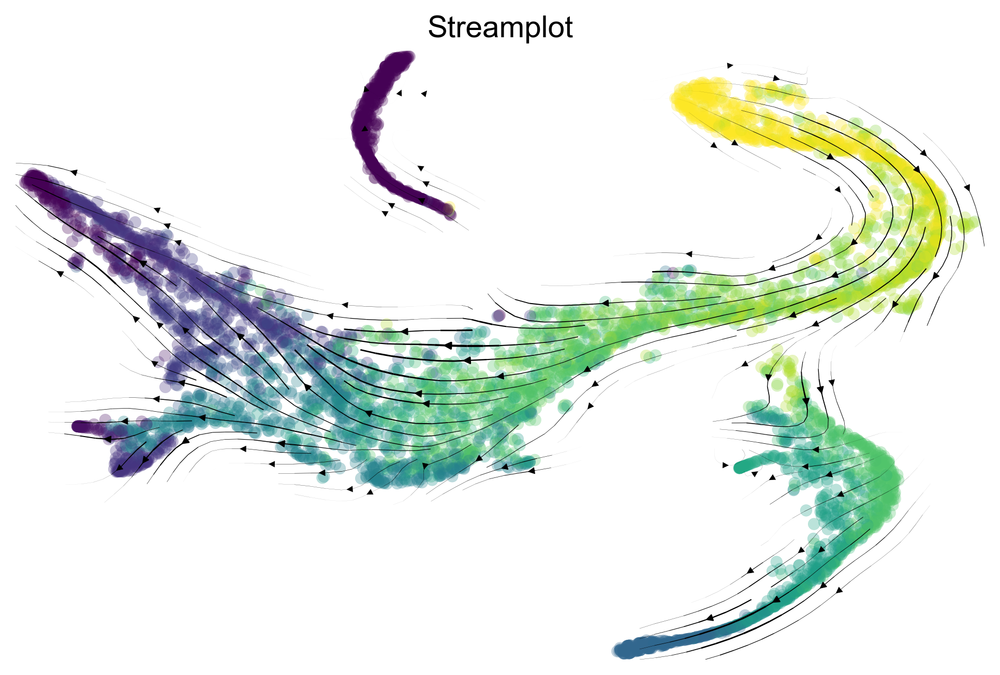

In [7]:
#Colored by pseudotime
v0.embedding = embedding
fig, ax = via.via_streamplot(v0,density_grid=0.8, scatter_size=30, color_scheme='time', linewidth=0.5, 
                             min_mass = 1, cutoff_perc = 5, scatter_alpha=0.3, marker_edgewidth=0.1, 
                             density_stream = 2, smooth_transition=1, smooth_grid=0.5)
fig.set_size_inches(8,5)

## Probabilistic pathways
Visualize the probabilistic pathways from root to terminal state as indicated by the lineage likelihood. The higher the linage likelihood, the greater the potential of that particular cell to differentiate towards the terminal state of interest.

2023-01-03 11:50:48.342566	Marker_lineages: [2, 3, 7, 9, 13, 15, 16, 17]
2023-01-03 11:50:48.349506	The number of components in the original full graph is 1
2023-01-03 11:50:48.349725	For downstream visualization purposes we are also constructing a low knn-graph 
2023-01-03 11:50:51.653031	Check sc pb [0.    0.    0.429 0.286 0.    0.286 0.    0.   ]
2023-01-03 11:50:51.760629	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 2: [1, 8, 0, 12, 4, 14, 10, 2]
2023-01-03 11:50:51.760716	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 3: [1, 8, 0, 12, 3]
2023-01-03 11:50:51.760739	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 7: [1, 11, 6, 7]
2023-01-03 11:50:51.760757	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 9: [1, 11, 6, 7, 9]
2023-01-03 11:50:51.760774	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 13: [1, 8, 0, 12, 3, 13]
2023-01-0

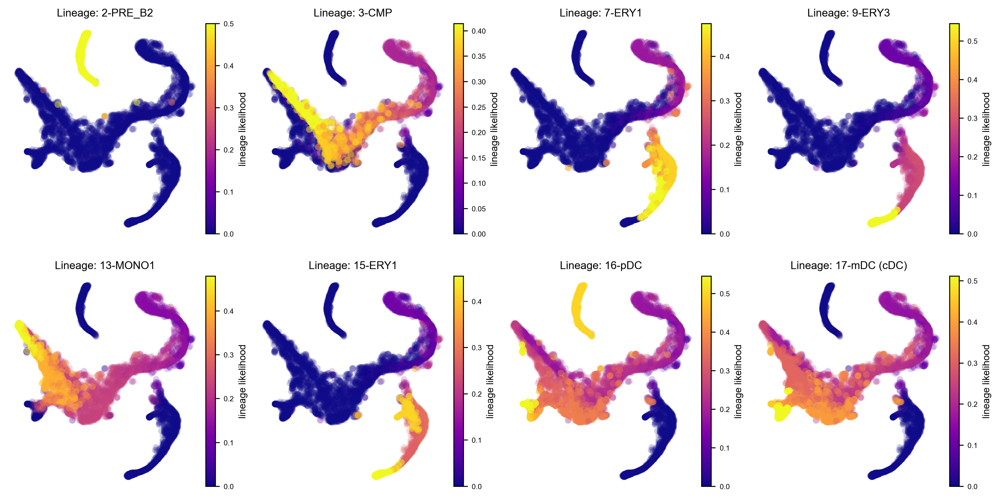

In [7]:
fig, axs= via.draw_sc_lineage_probability(via_coarse=v0,via_fine= v0, embedding=tsnem)
fig.set_size_inches(14,7)

2023-01-03 11:51:02.719027	Marker_lineages: [2, 3, 7]
2023-01-03 11:51:02.727956	The number of components in the original full graph is 1
2023-01-03 11:51:02.728377	For downstream visualization purposes we are also constructing a low knn-graph 
2023-01-03 11:51:06.038691	Check sc pb [0.    0.    0.429 0.286 0.    0.286 0.    0.   ]
2023-01-03 11:51:06.145316	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 2: [1, 8, 0, 12, 4, 14, 10, 2]
2023-01-03 11:51:06.145402	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 3: [1, 8, 0, 12, 3]
2023-01-03 11:51:06.145423	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 7: [1, 11, 6, 7]
2023-01-03 11:51:06.145442	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 9: [1, 11, 6, 7, 9]
2023-01-03 11:51:06.145461	Cluster path on clustergraph starting from Root Cluster 1 to Terminal Cluster 13: [1, 8, 0, 12, 3, 13]
2023-01-03 11:51:06.145478	C

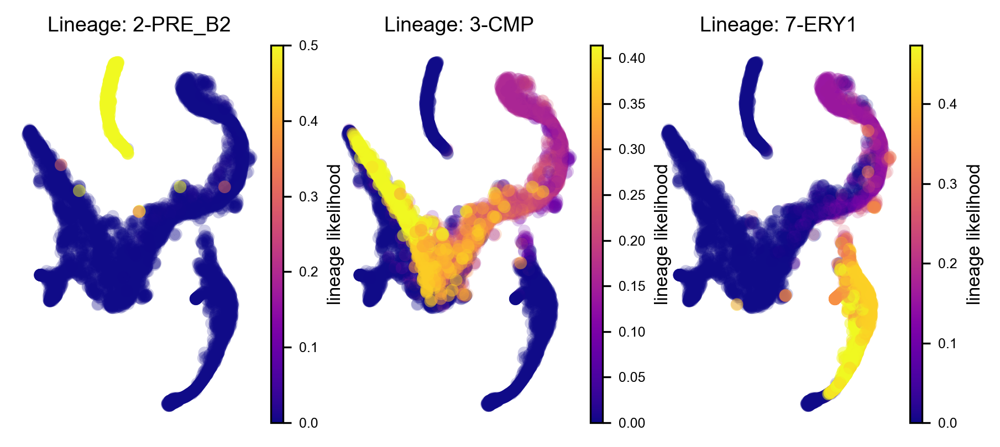

In [8]:
fig, axs= via.draw_sc_lineage_probability(via_coarse=v0,via_fine= v0, embedding=tsnem, marker_lineages = [2,3,7])
fig.set_size_inches(7,3)

## Gene Dynamics
The gene dynamics along pseudotime for all detected lineages are automatically inferred by VIA. These can be interpreted as the change in gene expression along any given lineage.
#### Key Parameters
- n_splines
- spline_order
- gene_exp (dataframe) single-cell level gene expression of select genes (gene imputation is an optional pre-step)

shape of transition matrix raised to power 3 (5780, 5780)


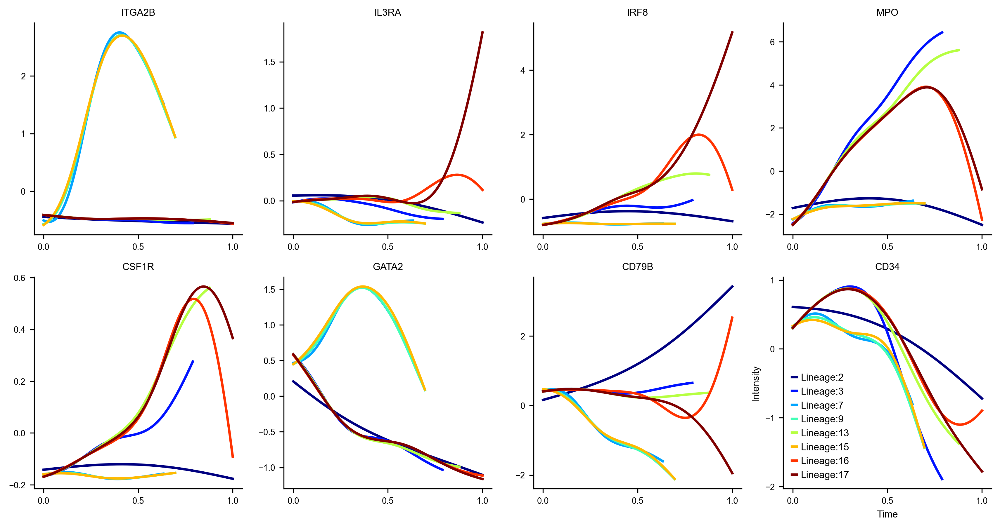

In [9]:
marker_genes =['ITGA2B', 'IL3RA', 'IRF8', 'MPO', 'CSF1R', 'GATA2', 'CD79B', 'CD34']
df = pd.DataFrame(adata.X, columns = adata.var_names)
df_magic = v0.do_impute(df, magic_steps=3, gene_list=gene_list_magic) #optional
fig, axs=via.get_gene_expression(via0=v0, gene_exp=df_magic[marker_genes])
fig.set_size_inches(14,7)

## Gene Dynamics
Heatmaps of genes along pseudotimetime
#### Key Parameters
- df_gene_exp (dataframe) single-cell level gene expression of selected genes
- marker_lineages (list, optional) to specify which lineages to plot heatmaps for

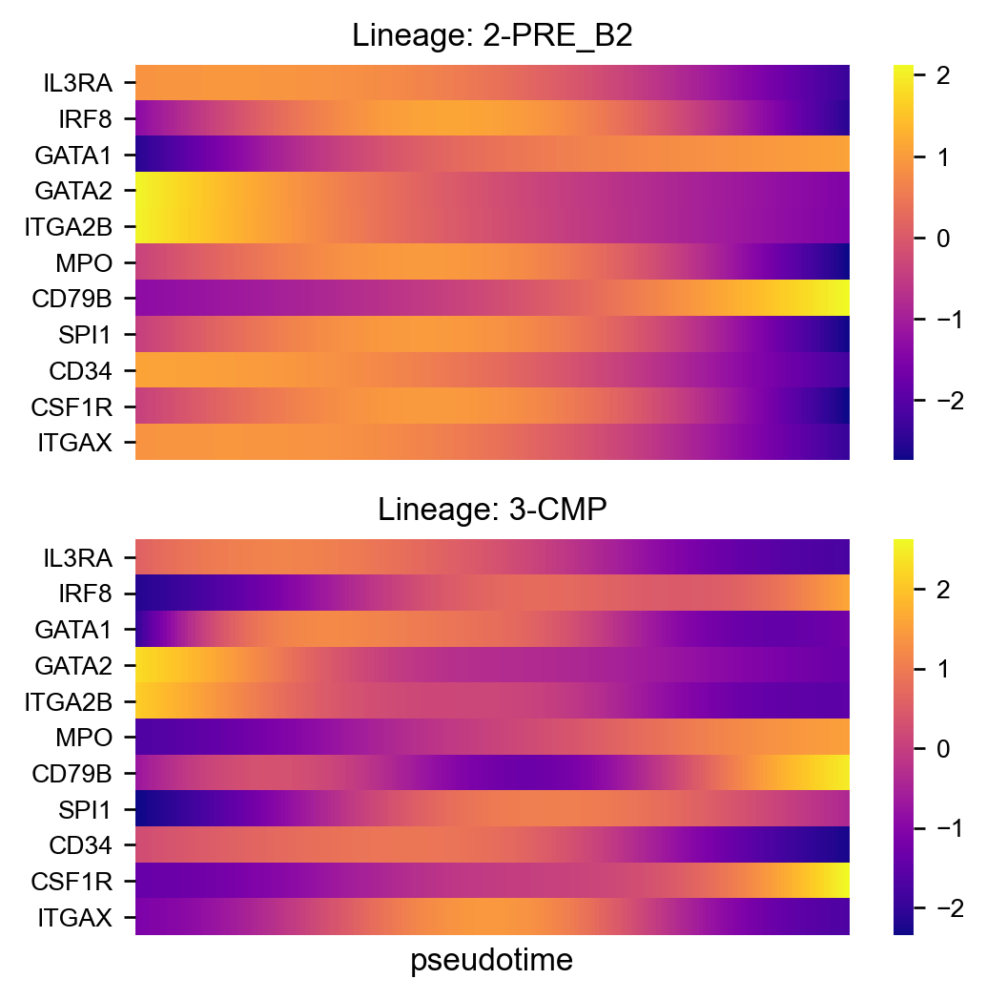

In [11]:
fig, axs = via.plot_gene_trend_heatmaps(via_object=v0, df_gene_exp=df_magic, cmap='plasma',
                             marker_lineages=[2,3])
fig.set_size_inches(5,5)

## Various Visualizations
### Visualizations of the trajectory can be plotted at various edge resolutions

## Edge bundle plot
#### Key Parameters (default):
- alpha_bundle_factor=1
- linewidth_bundle=2
- cmap:str = 'plasma_r'
- size_scatter:int=2
- alpha_scatter:float = 0.2 
- headwidth_bundle=0.1

2023-01-03 09:24:38.570736	Computing Edges
2023-01-03 09:24:38.570852	Start finding milestones
2023-01-03 09:24:47.796023	End milestones
2023-01-03 09:24:47.822500	Recompute weights
2023-01-03 09:24:47.973642	pruning milestone graph based on recomputed weights
2023-01-03 09:24:47.978335	Graph has 1 connected components before pruning
2023-01-03 09:24:47.979170	Graph has 1 connected components before pruning
2023-01-03 09:24:47.986368	regenerate igraph on pruned edges
2023-01-03 09:24:48.040678	Setting numeric label as time_series_labels or other sequential metadata for coloring edges
2023-01-03 09:24:48.115835	Making smooth edges
2023-01-03 09:26:23.981005	Finished plot


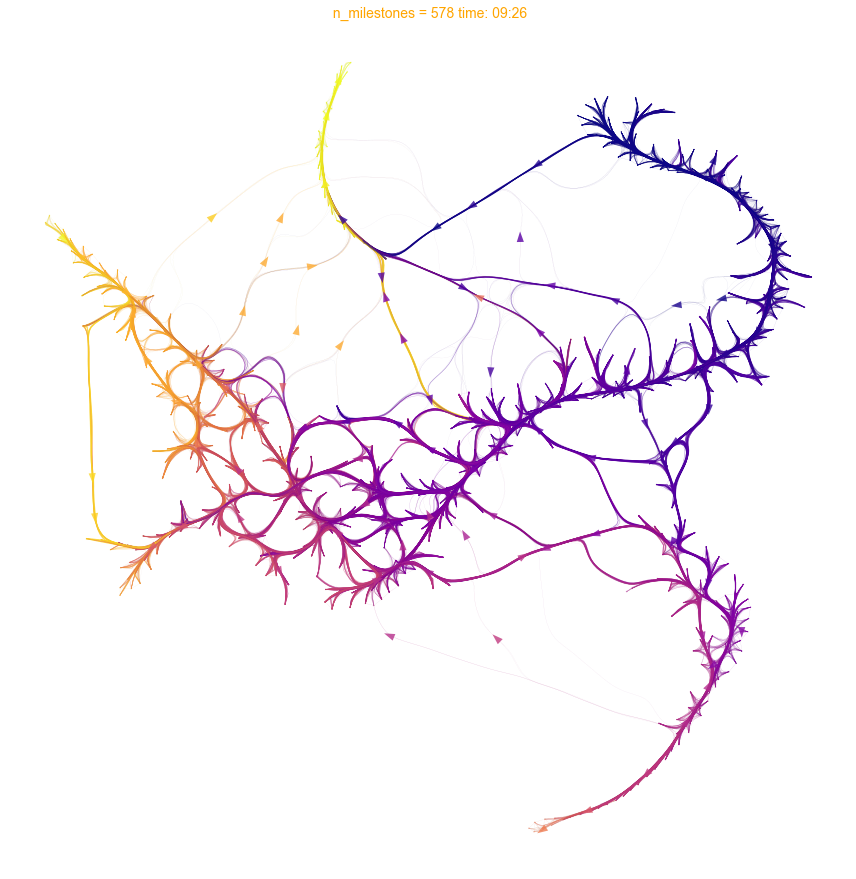

In [14]:
# running plot_edge_bundle() requires that the VIA object has an embedding attribute
v0.embedding = tsnem

fig, ax = via.plot_edge_bundle(via_object=v0, headwidth_bundle=0.5) 
fig.set_size_inches(15,15)

2023-01-03 09:30:03.921677	Start finding milestones
2023-01-03 09:30:13.758942	End milestones
2023-01-03 09:30:13.782189	Recompute weights
2023-01-03 09:30:13.794376	pruning milestone graph based on recomputed weights
2023-01-03 09:30:13.795283	Graph has 1 connected components before pruning
2023-01-03 09:30:13.795607	Graph has 1 connected components before pruning
2023-01-03 09:30:13.796562	regenerate igraph on pruned edges
2023-01-03 09:30:13.803110	Setting numeric label as single cell pseudotime for coloring edges
2023-01-03 09:30:13.817183	Making smooth edges
2023-01-03 09:30:18.776142	Finished plot


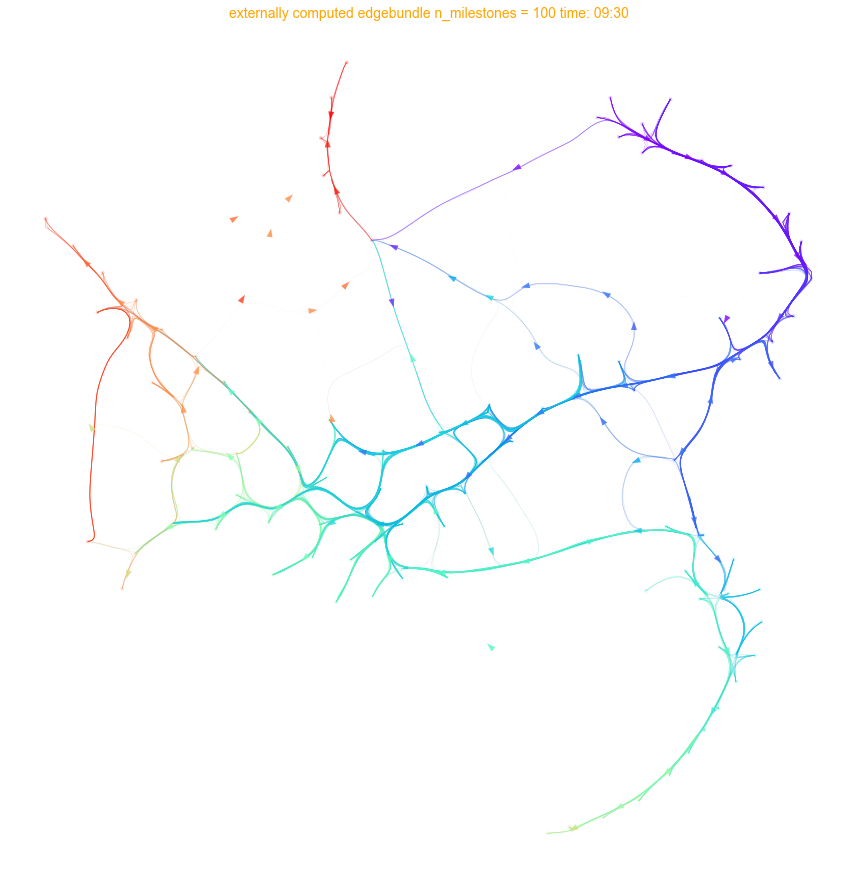

In [15]:
# edge plots can be made with different edge resolutions. Run hammerbundle_milestone_dict() to recompute the edges for plotting. Then provide the new hammerbundle as a parameter to plot_edge_bundle()
hammerbundle_milestone_dict = via.make_edgebundle_milestone(via_object=v0, , n_milestones=100,global_visual_pruning=0.5, decay=0.7, initial_bandwidth=0.05)

fig, ax=via.plot_edge_bundle(hammerbundle_dict=hammerbundle_milestone_dict,
                     linewidth_bundle=1.5, alpha_bundle_factor=2,
                     cmap='rainbow', facecolor='white', size_scatter=15, alpha_scatter=0.2,
                     extra_title_text='externally computed edgebundle', headwidth_bundle=0.4)
fig.set_size_inches(15,15)

## Animated Stream plot

2023-01-03 09:32:23.524989	Inside animated. File will be saved to location /home/shobi/Trajectory/Datasets/HumanCD34/HumanCD34_animation_Jan3.gif


  0%|          | 0/250 [00:00<?, ?it/s]

total number of stream lines 201


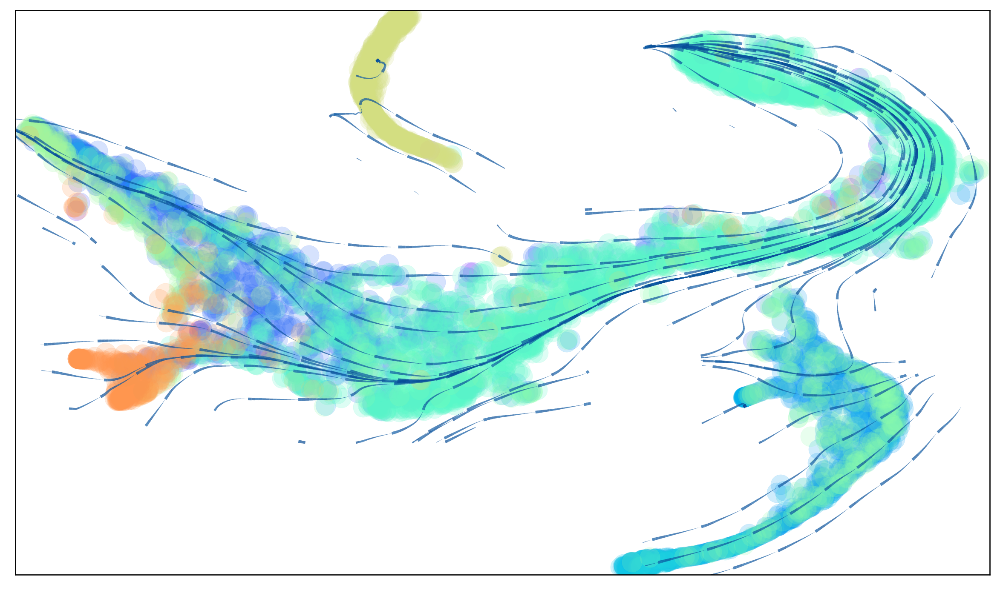

(<Figure size 1200x720 with 1 Axes>, <AxesSubplot:>)

In [16]:
sc.settings.set_figure_params(dpi=120, facecolor='white')
#the streamlines load very slowly through the Notebook, so see the code below to open the file and view the animation properly
via.animated_streamplot(v0, embedding=tsnem, cmap_stream='Blues', scatter_size=200, scatter_alpha=0.2, marker_edgewidth=0.15, 
                        density_grid=0.7, linewidth=0.1, segment_length=1.5, saveto='/home/shobi/Trajectory/Datasets/HumanCD34/HumanCD34_animation_Jan3.gif')

In [14]:
from IPython.display import Image

with open('./Figures/HumanCD34_animation.gif','rb') as file:
    display(Image(file.read()))

## Animated edge bundle plot

making hammerbundle
2022-11-08 16:46:46.082215	Start kmeans milestone
2022-11-08 16:46:50.162267	End kmeans milestone
2022-11-08 16:46:50.230431	Recompute weights
2022-11-08 16:46:50.348908	pruning milestone graph based on recomputed weights
2022-11-08 16:46:50.358479	Graph has 1 connected components before pruning
2022-11-08 16:46:50.358479	Graph has 1 connected components before pruning
2022-11-08 16:46:50.368028	regenerate igraph on pruned edges
2022-11-08 16:46:50.456737	make node dataframe
2022-11-08 16:46:50.472879	Setting numeric label as time_series_labels or other sequential metadata for coloring edges
2022-11-08 16:46:50.592365	Hammer bundling
seg weight 0.1311759587041706


MovieWriter imagemagick unavailable; using Pillow instead.


2022-11-08 16:47:46.937861	Finished plotting edge bundle
times series order set [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
number cycles if no time_series labels given 40.0
complete animate
inside update 0 out of 120
inside update 0 out of 120
inside update 1 out of 120
inside update 2 out of 120
inside update 3 out of 120
inside update 4 out of 120
inside update 5 out of 120
inside update 6 out of 120
inside update 7 out of 120
inside update 8 out of 120
inside update 9 out of 120
inside update 10 out of 120
inside update 11 out of 120
inside update 12 out of 120
inside update 13 out of 120
inside update 14 out of 120
inside update 15 out of 120
inside update 16 out of 120
inside update 17 out of 120
inside update 18 out of 120
inside update 19 out of 120
inside update 20 out of 120
inside update 21 out of 120
inside update 22 out of 120
inside update 23 out of 120
inside update 24 out of 120
inside update 25 out of 120
inside update 26 out of 120
inside update 27 out of 120
inside update 28 

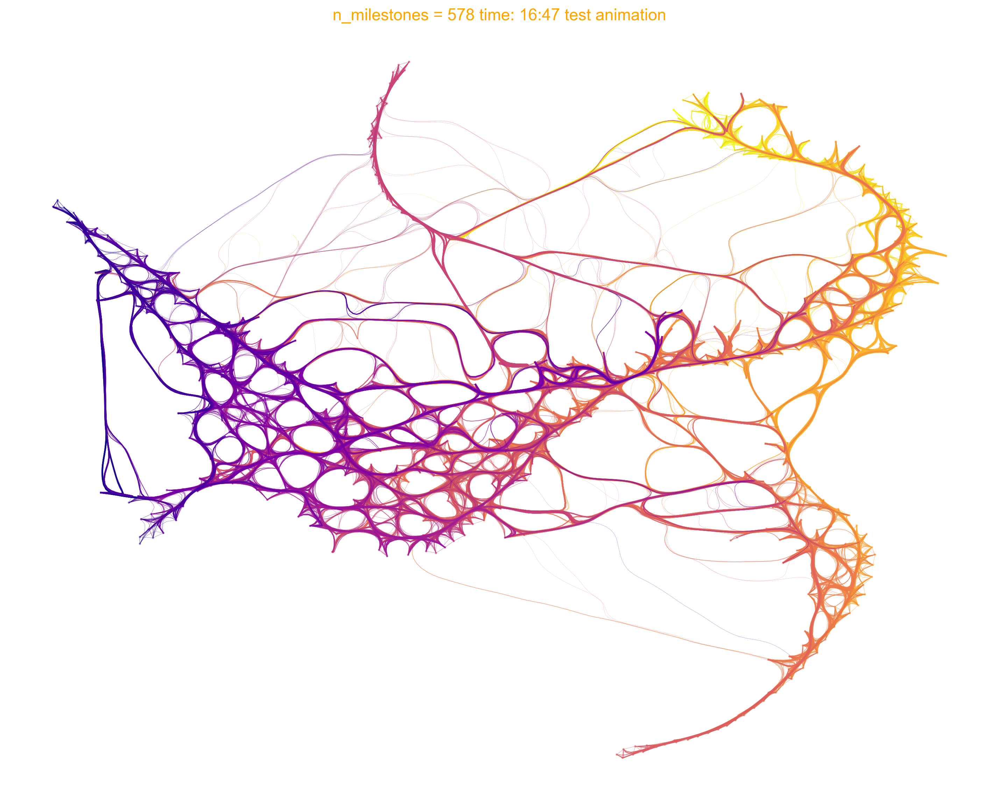

In [ ]:
via.animate_edge_bundle(via_object=v0, extra_title_text='test animation', n_milestones=None,
                        saveto='./Figures/human_edgebundle_test.gif')

In [ ]:
from IPython.display import Image
with open('./Figures/human_edgebundle_test.gif','rb') as file:
    display(Image(file.read()))